# 1. Import modules and load MERFISH data 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

# 2. Load MERLin analysis results

In [2]:
merlin_output_folder = r'\\mendel\Mendel_SSD3\MERFISH_Analysis\20220630-hMTG'
# generate post-analysis folders
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: \\mendel\Mendel_SSD3\MERFISH_Analysis\20220630-hMTG\PostAnalysis


In [3]:
figure_folder = os.path.join(postanalysis_folder, 'Figures')
if not os.path.exists(figure_folder):
    print(f"Create figure_folder: {figure_folder}")
    os.makedirs(figure_folder)
else:
    print(f"Use figure_folder: {figure_folder}")

sc.settings.figdir = figure_folder

Create figure_folder: \\mendel\Mendel_SSD3\MERFISH_Analysis\20220630-hMTG\PostAnalysis\Figures


## Load metadata

In [4]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,106115004444432935559824562065233489002,0,855.225869,-4607.269999,-2878.089998,-4612.626799,-4601.913199,-2885.174799,-2871.005198
1,108671904370043051002359232830074993516,0,1148.556472,-4576.327999,-2859.675998,-4583.034799,-4569.621198,-2866.490798,-2852.861198
2,116213226133710598114471826268507642475,0,999.349877,-4499.161997,-2830.893997,-4506.894797,-4491.429196,-2839.490797,-2822.297197
3,117800700362950777371601897815790505479,0,34.038295,-4616.504000,-2939.914600,-4618.566800,-4614.441199,-2941.000000,-2938.829200
4,117806444272757059874711869676084151681,0,52.239676,-4430.203995,-2768.955996,-4432.050795,-4428.357195,-2770.586796,-2767.325195
...,...,...,...,...,...,...,...,...,...
16414,88578338600387801828962071629382321962,239,317.018555,3703.636004,-2749.353995,3697.901204,3709.370804,-2754.710795,-2743.997195
16415,89018773570230180608093780162327374704,239,1627.717933,3664.054003,-2831.595997,3656.753203,3671.354803,-2840.138797,-2823.053197
16416,90950427712306155776360433815331011720,239,1606.390658,3585.268001,-2852.331998,3577.373201,3593.162801,-2860.118798,-2844.545197
16417,96265352735247506658697639737227413795,239,57.811336,3739.222005,-2907.087999,3736.781205,3741.662805,-2910.122799,-2904.053199


In [5]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')

In [6]:
# remove blanks
blanks = [_c for _c in df.columns if 'Blank-' in _c]
df = df.drop(columns=blanks)

adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

df

,SORBS2,NTNG1,FBN2,PAX6,ADAMTS6,DCN,CHST9,C10orf11,ROR2,SLC22A25,...,ADAMTS17,ANKRD36BP2,ADAMTS19,HGF,KIAA1024,GLIS3,BEND4,DNAH6,ANKRD30B,BMP6
index,,,,,,,,,,,,,,,,,,,,,
106115004444432935559824562065233489002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
108671904370043051002359232830074993516,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
116213226133710598114471826268507642475,1.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
117800700362950777371601897815790505479,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
117806444272757059874711869676084151681,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88578338600387801828962071629382321962,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
89018773570230180608093780162327374704,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
90950427712306155776360433815331011720,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [7]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

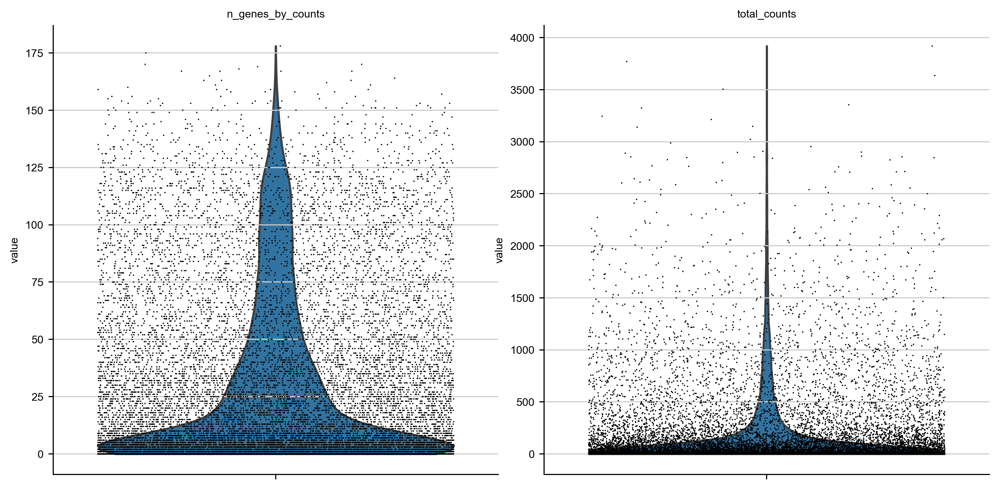

In [8]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

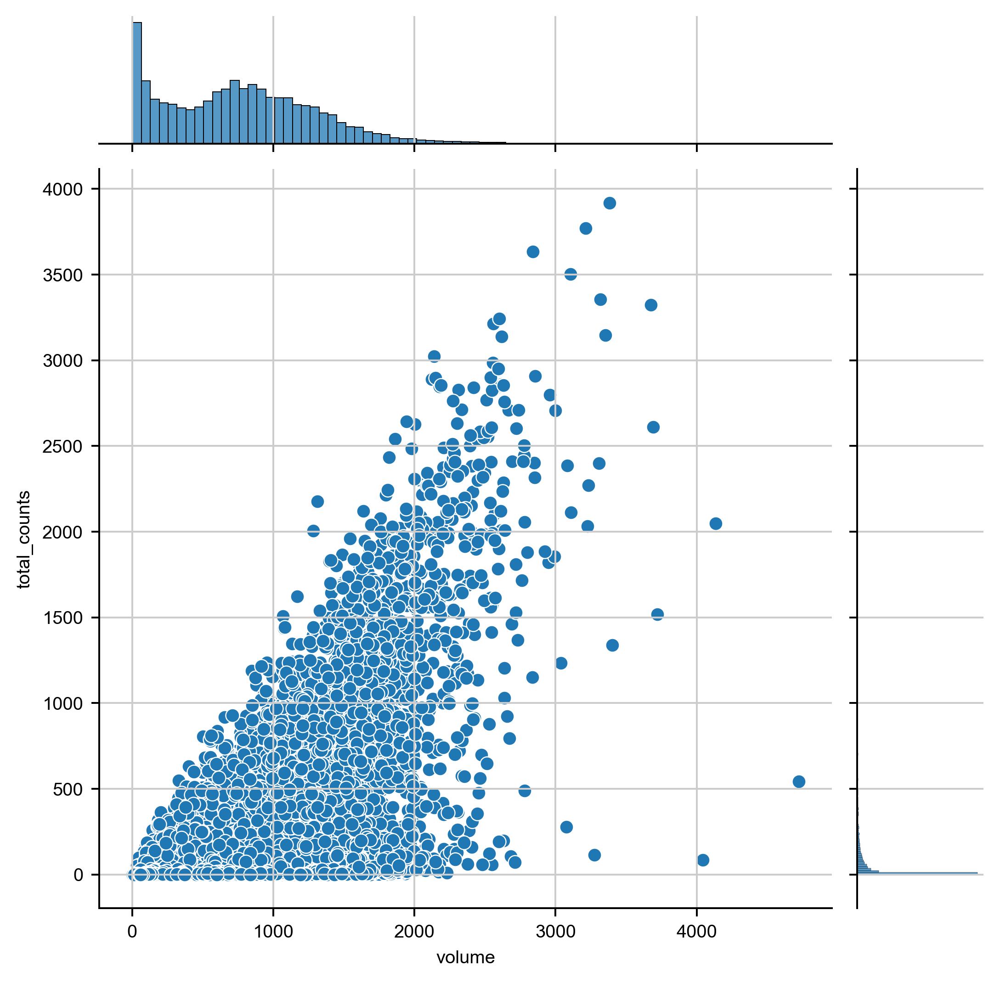

In [9]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

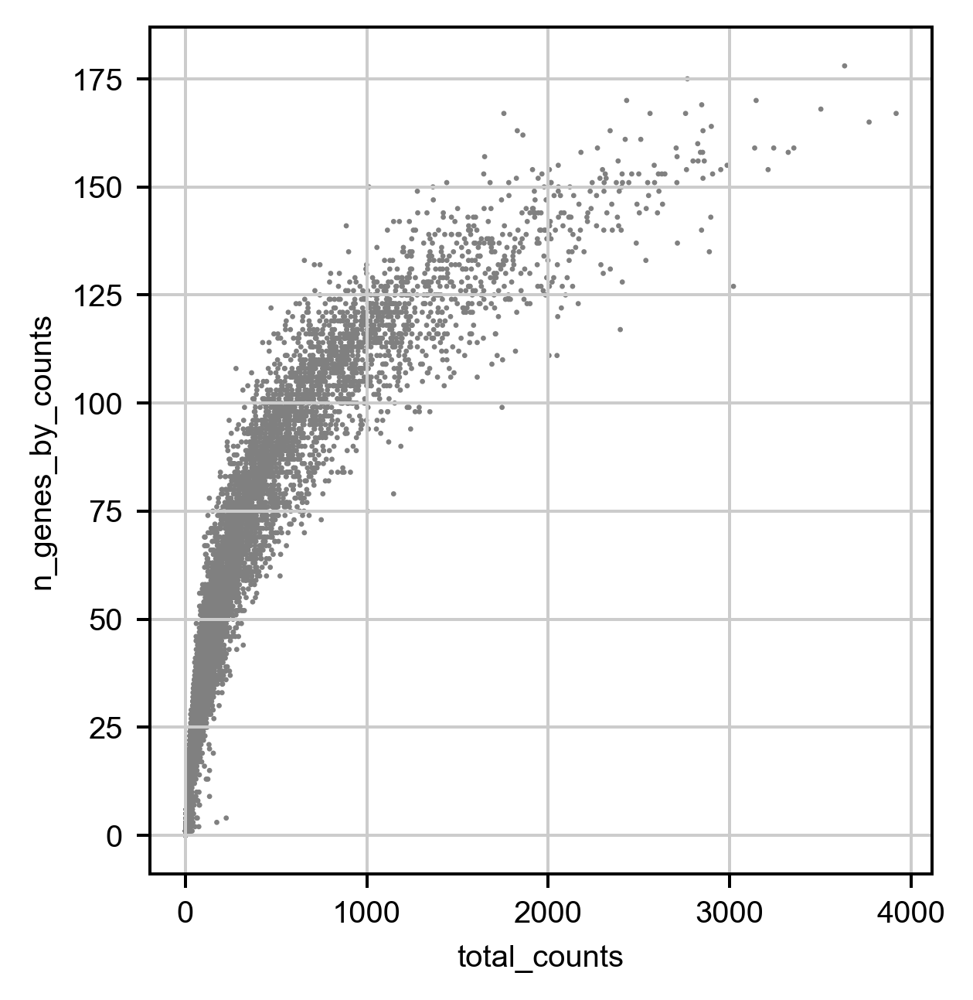

In [10]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [11]:
gene_count_threshold = 10
total_count_threshold = 20
volume_threshold = 200
volume_upper_threshold = 6000
# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]
adata = adata[adata.obs['volume'] <= volume_upper_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.4840124246300018 7947


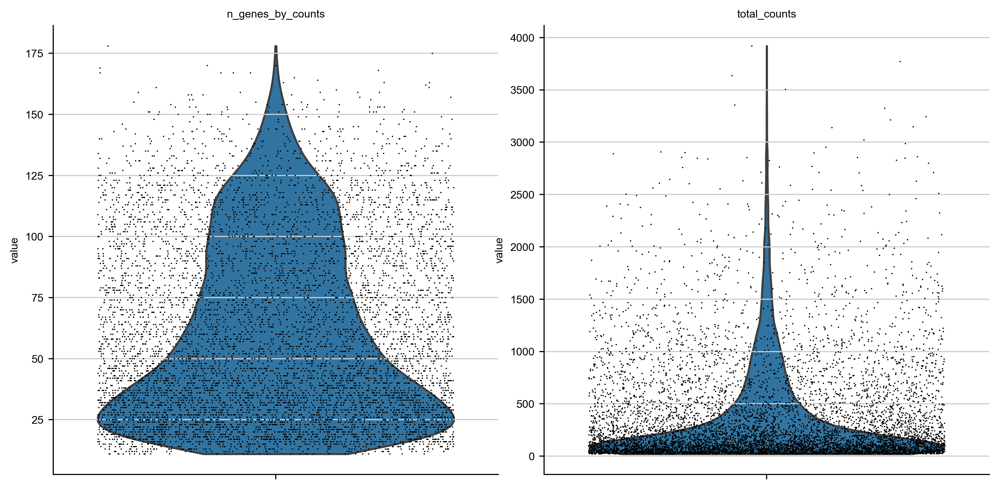

In [12]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, save='_after_filter_counts.png')

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


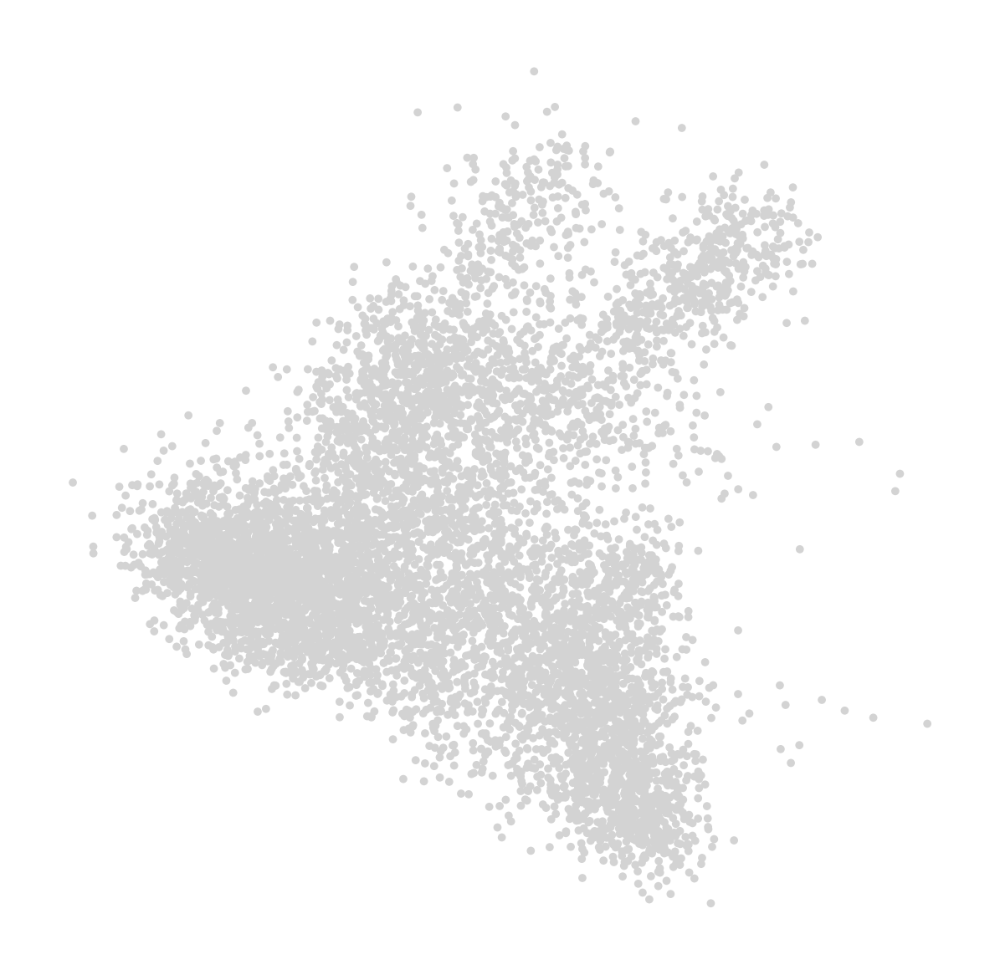

Wall time: 22.3 s


In [13]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [14]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=30)

Wall time: 15.4 s


In [15]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=0.4)

Wall time: 397 ms


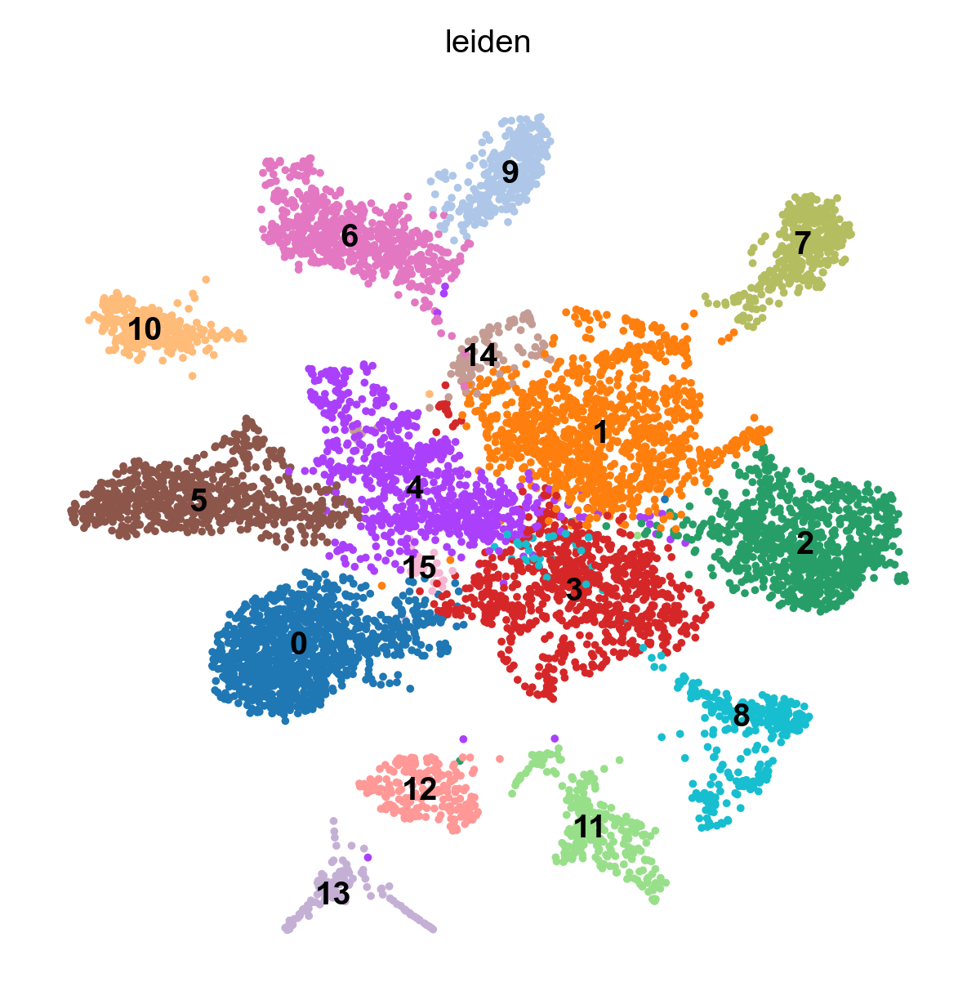

Wall time: 11.7 s


In [16]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

## 5. Check count for each cell for genes of interest

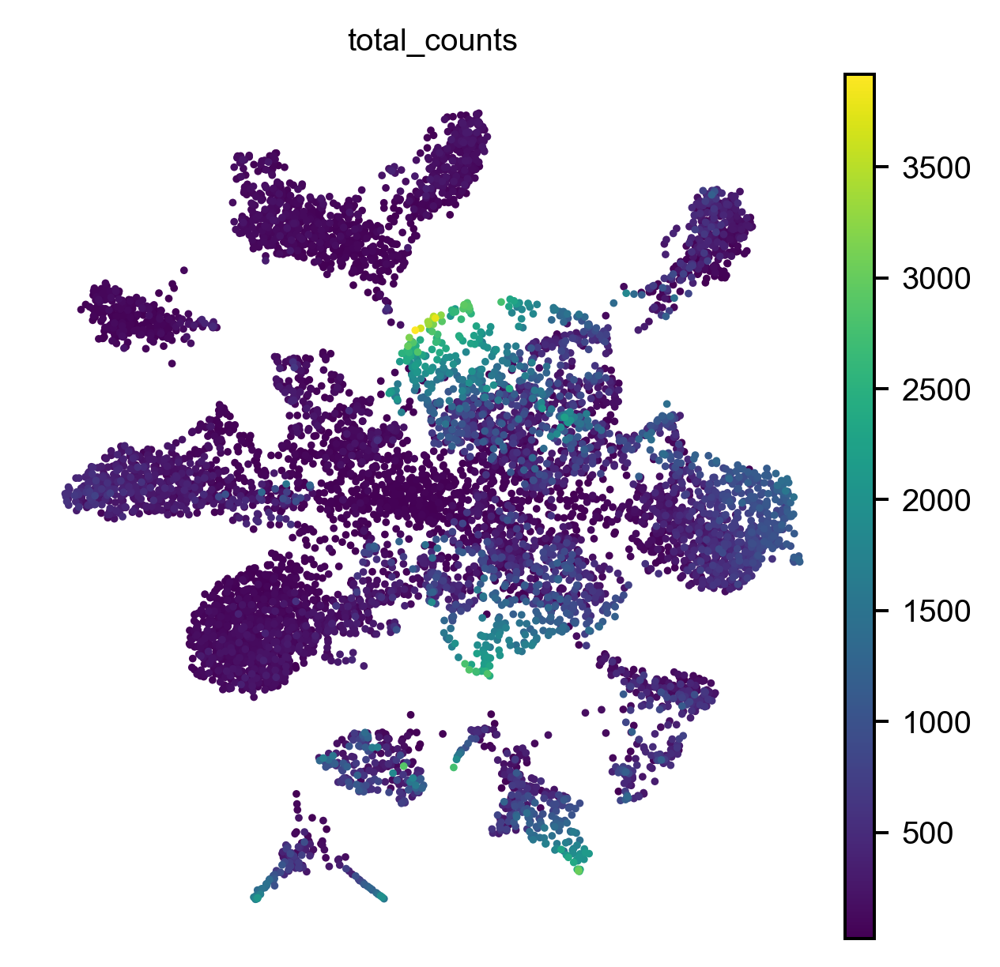

In [17]:
sc.pl.umap(adata, color='total_counts')

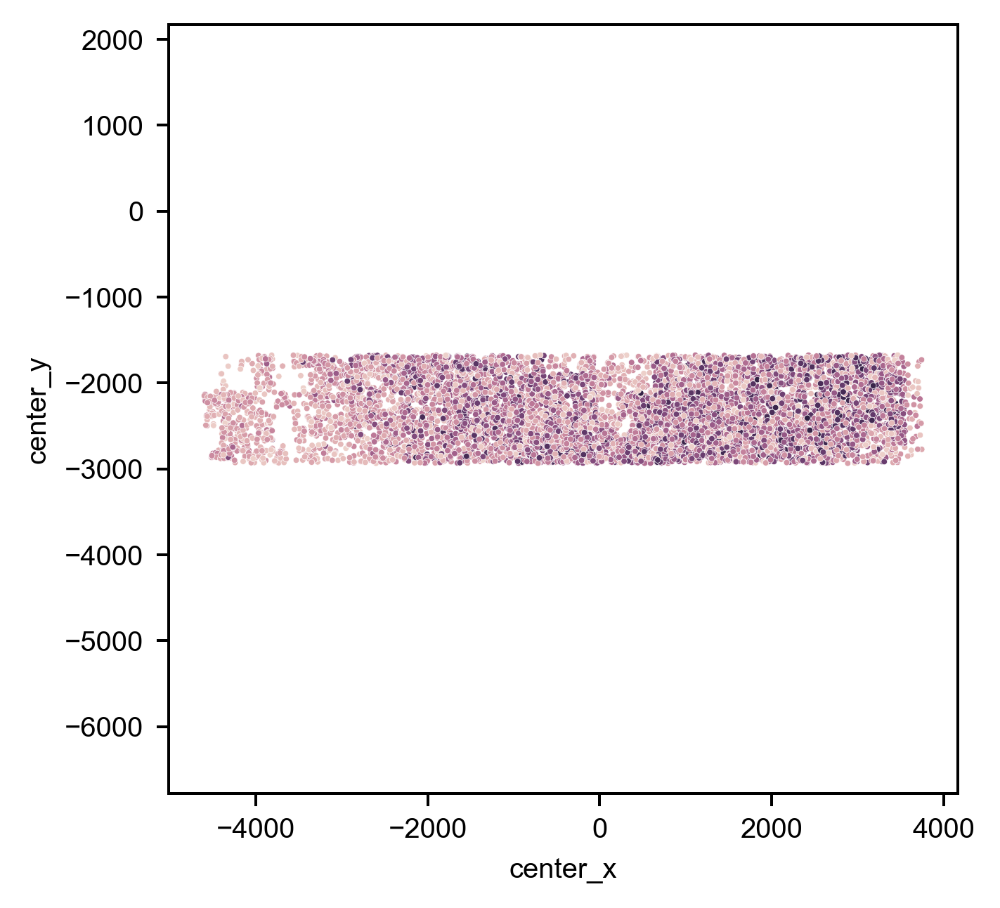

In [18]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                hue='total_counts', hue_norm=LogNorm(), s=3, legend=False, )
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
#ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])

# 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

In [19]:
# direcly use previous leiden
adata.obs['leiden_cluster'] = adata.obs.leiden

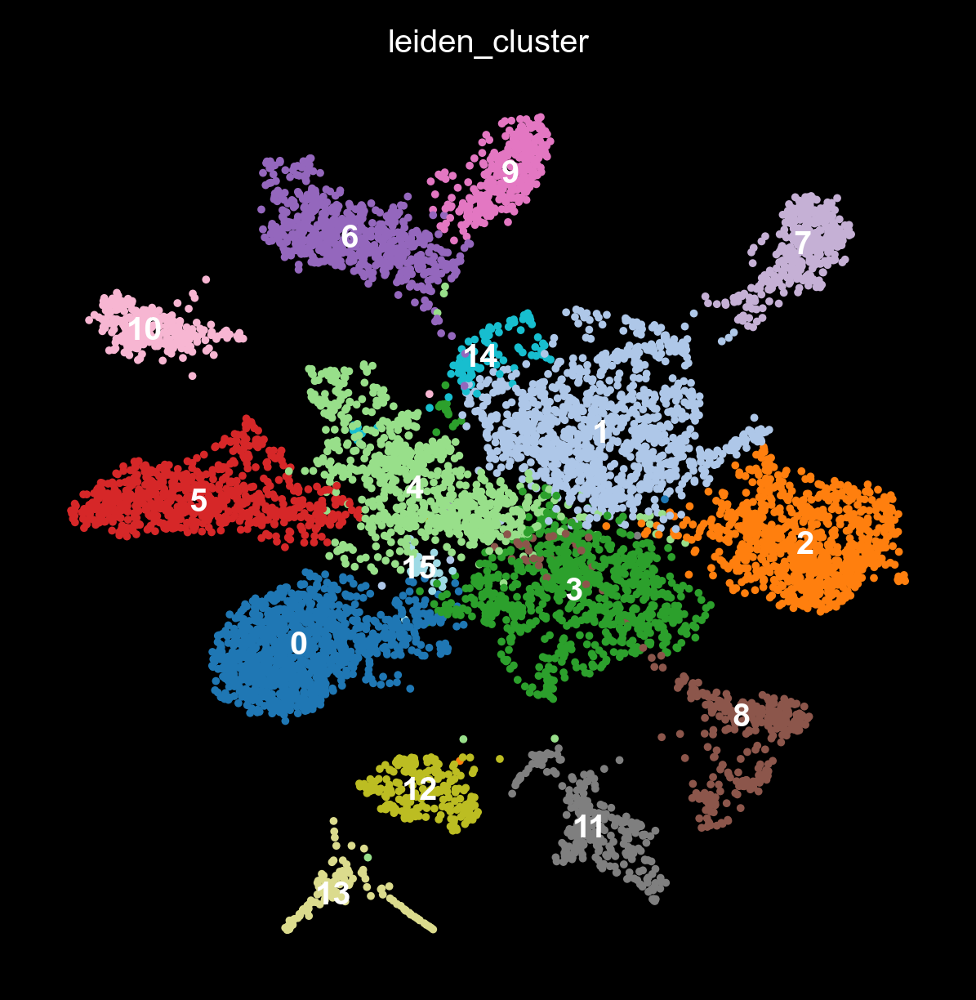

In [20]:
plt.style.use('dark_background')

sc.pl.umap(adata, color='leiden_cluster', 
           legend_loc='on data',
           palette='tab20',
           save='_dark_cluster.png',
           )

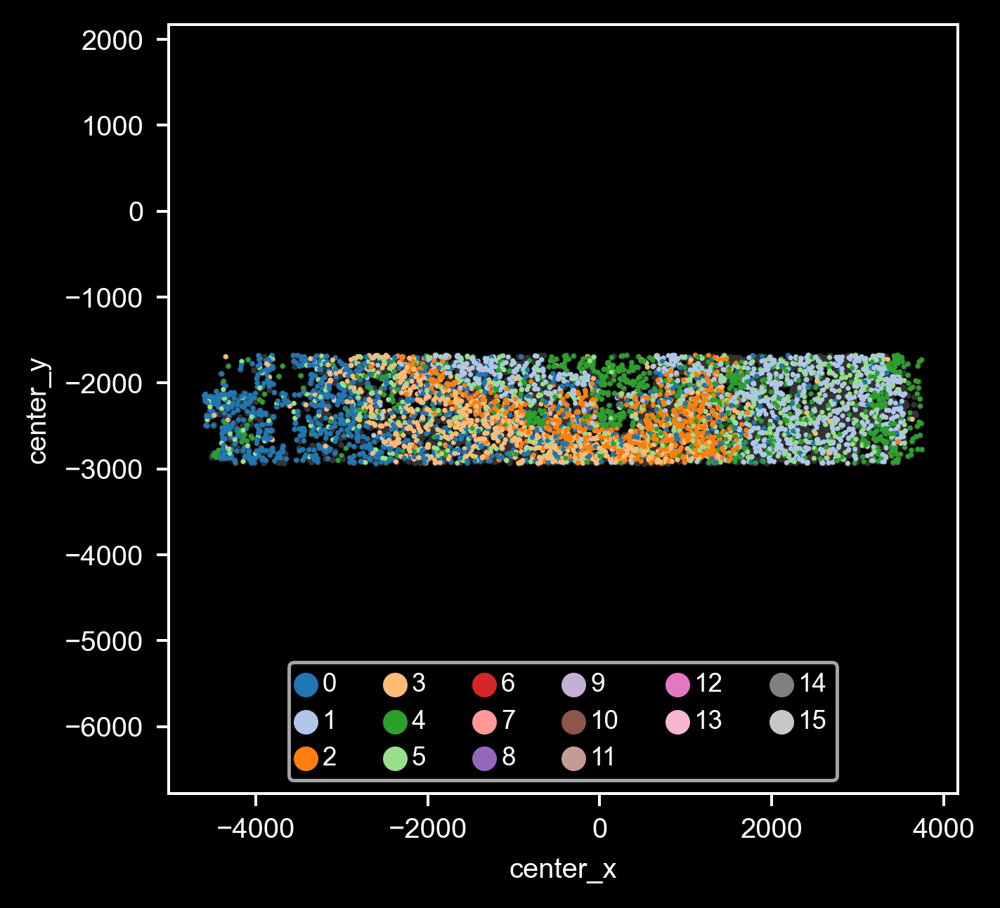

In [23]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
#plt.style.use('dark_background')
sel_clusters = ['0', '1', '2', '3', '4', '5']
#sel_clusters = np.unique(adata.obs['leiden_cluster'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if _cls in sel_clusters]
ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.2,0.2,0.2], s=3, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2, legend=True, linewidth=0)
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=6, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
#plt.savefig(os.path.join(figure_folder, 'spatial_sel_clusters.png'), transparent=True)

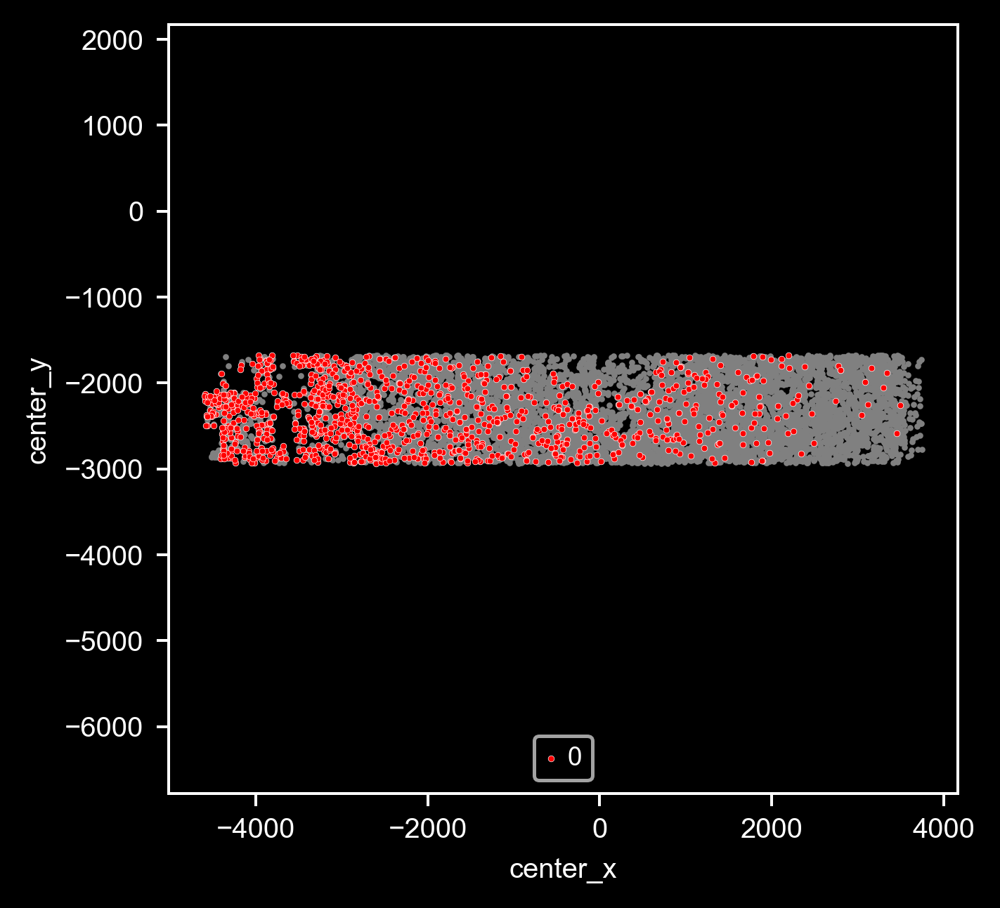

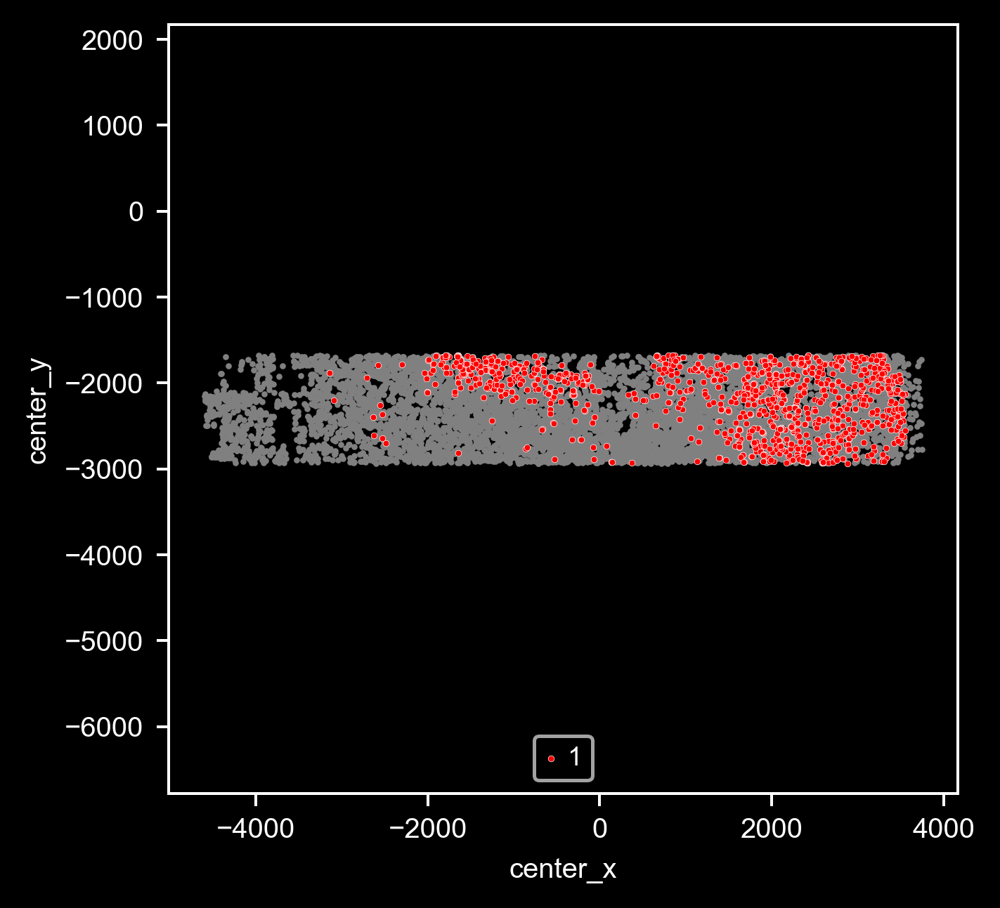

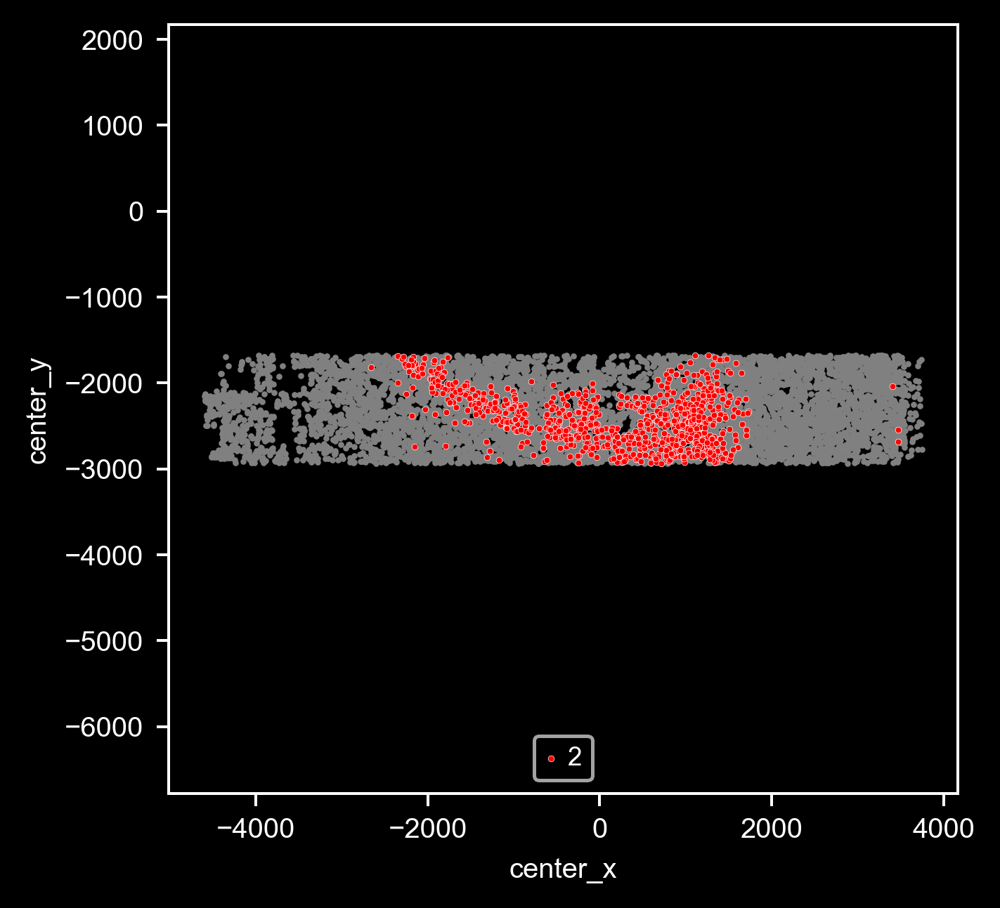

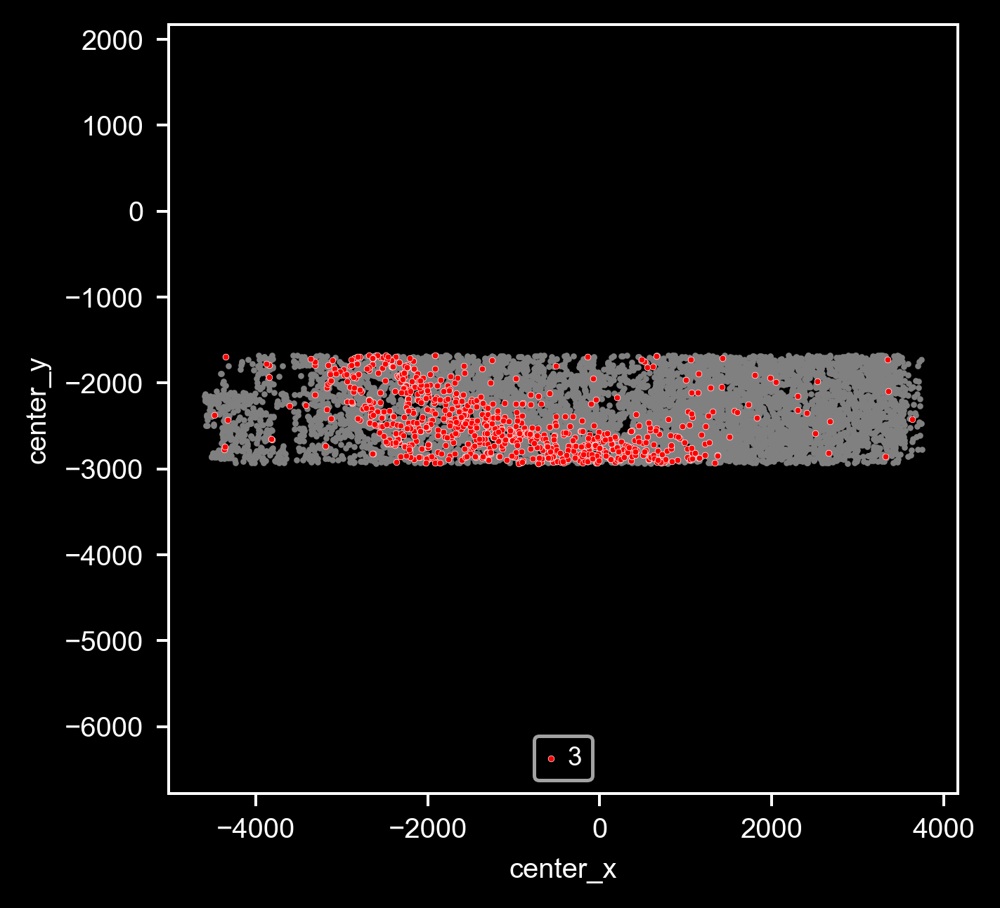

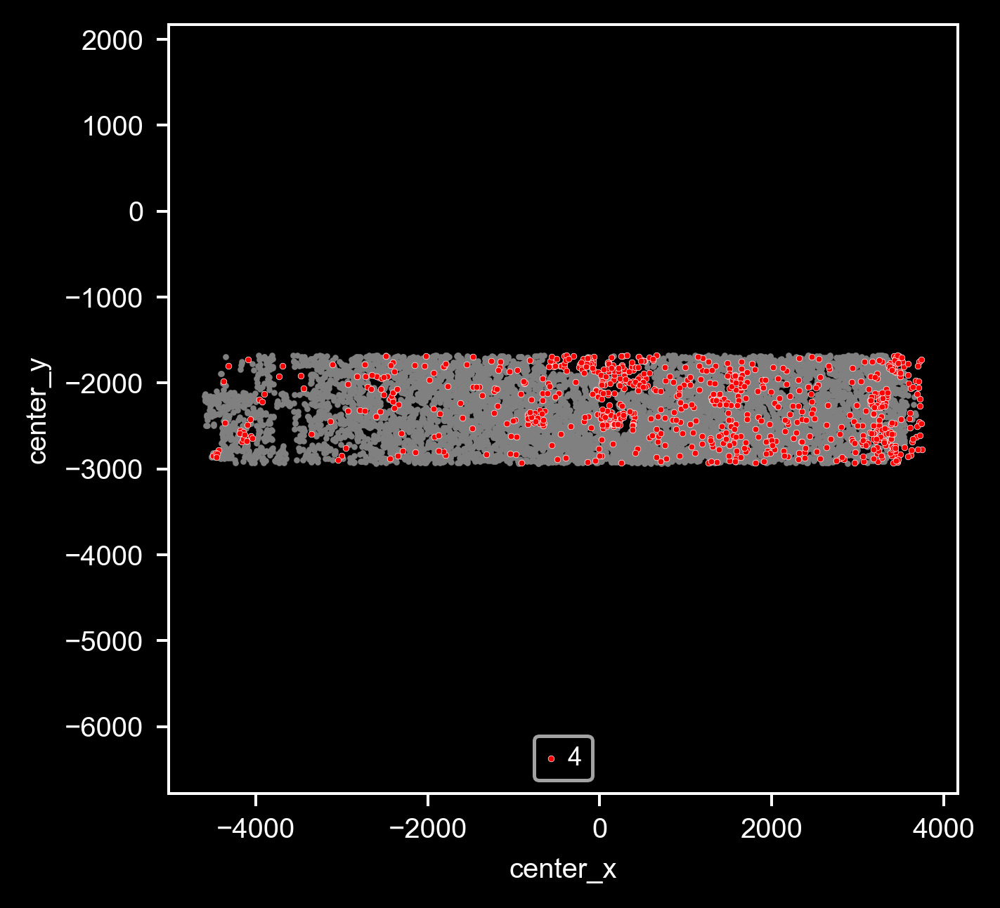

...

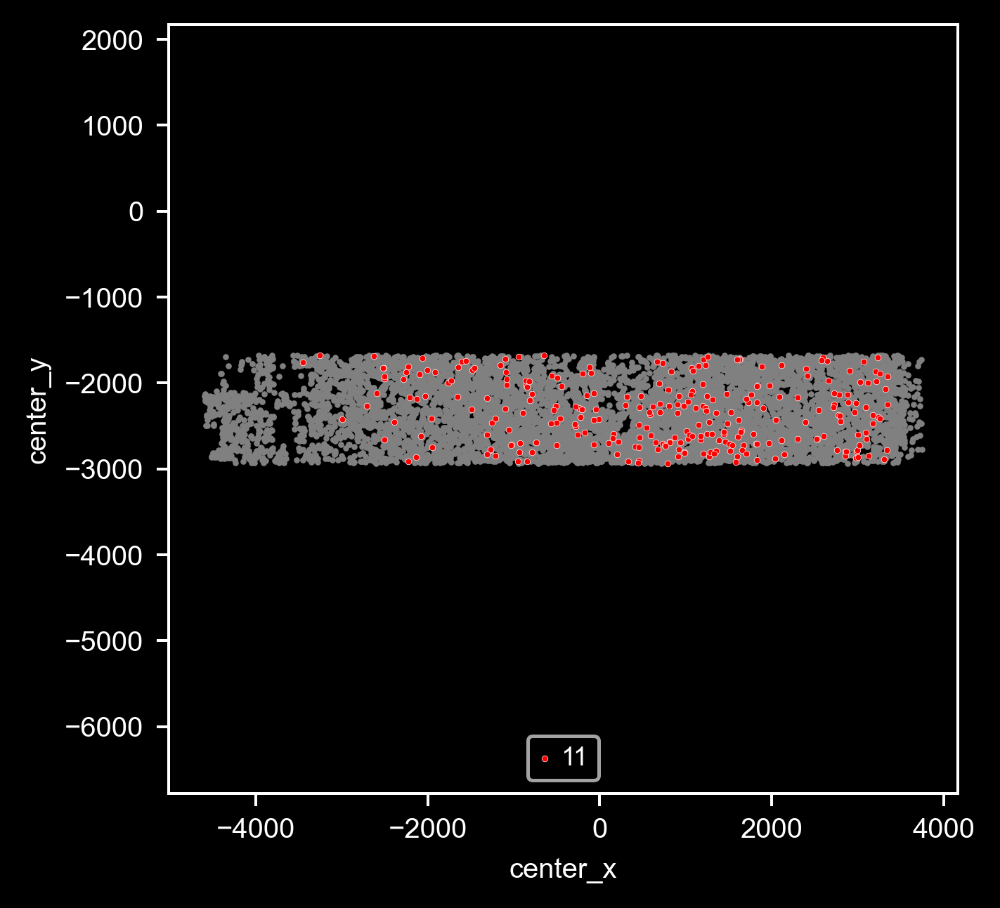

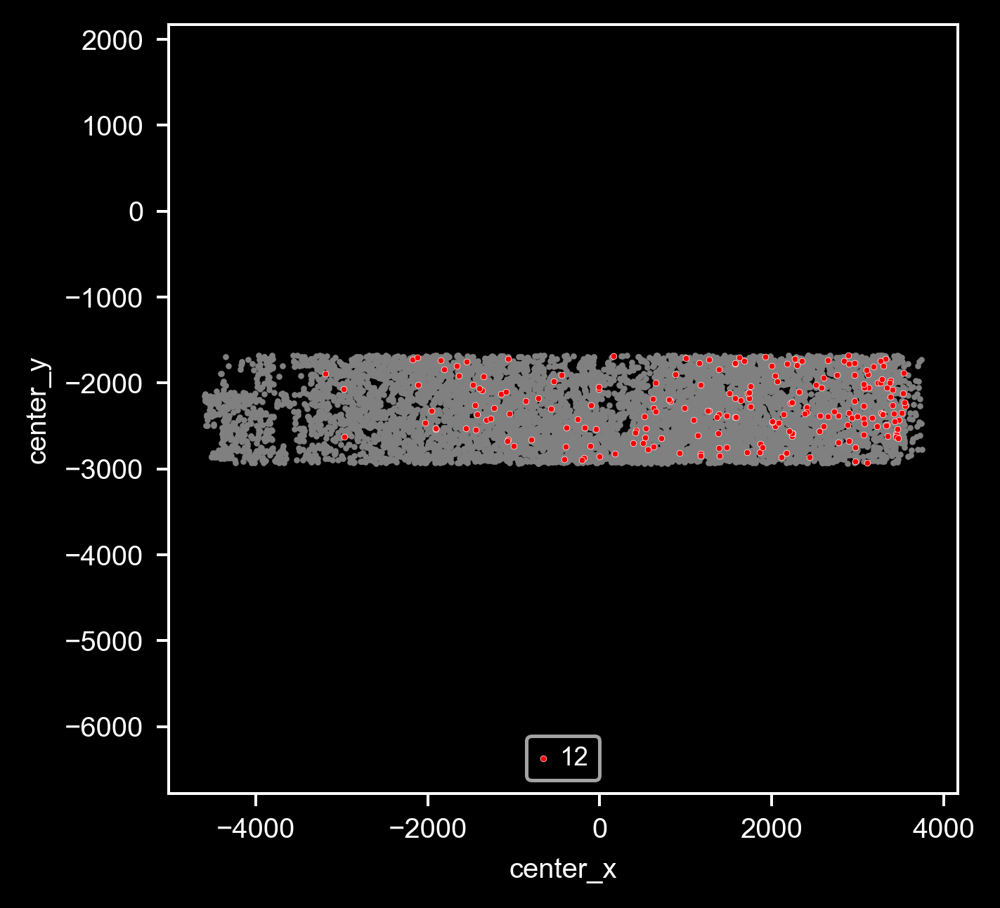

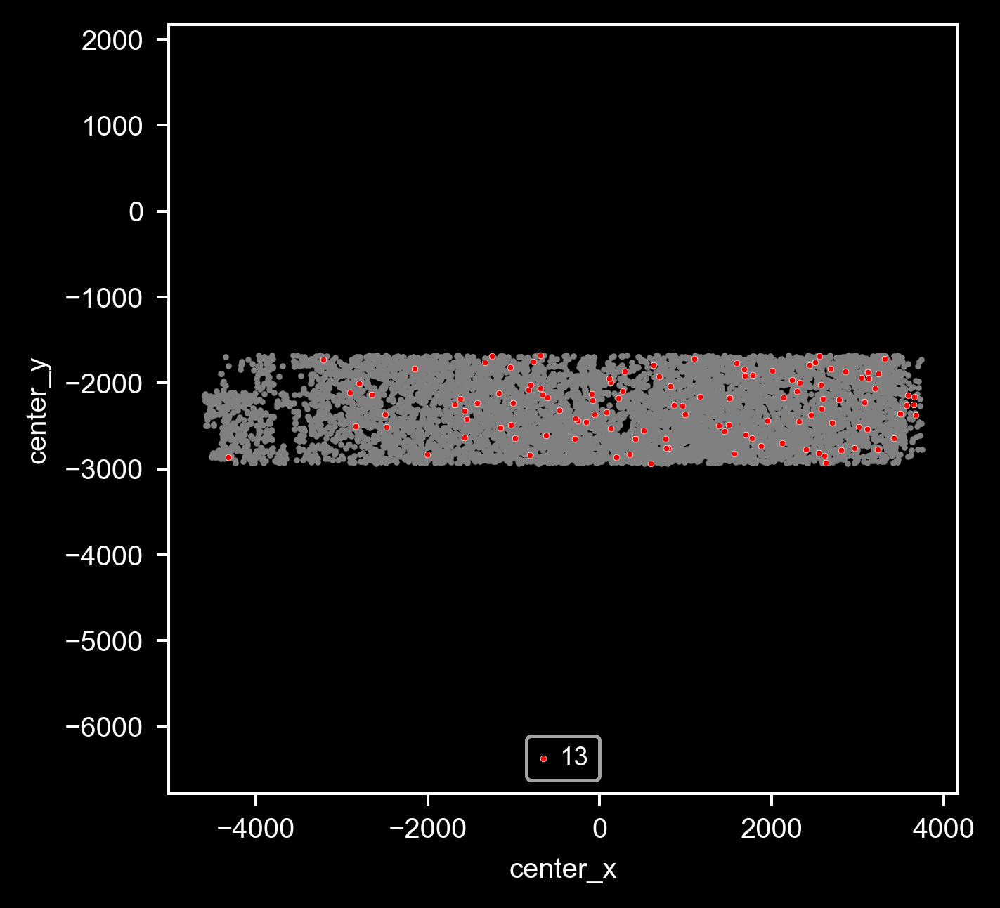

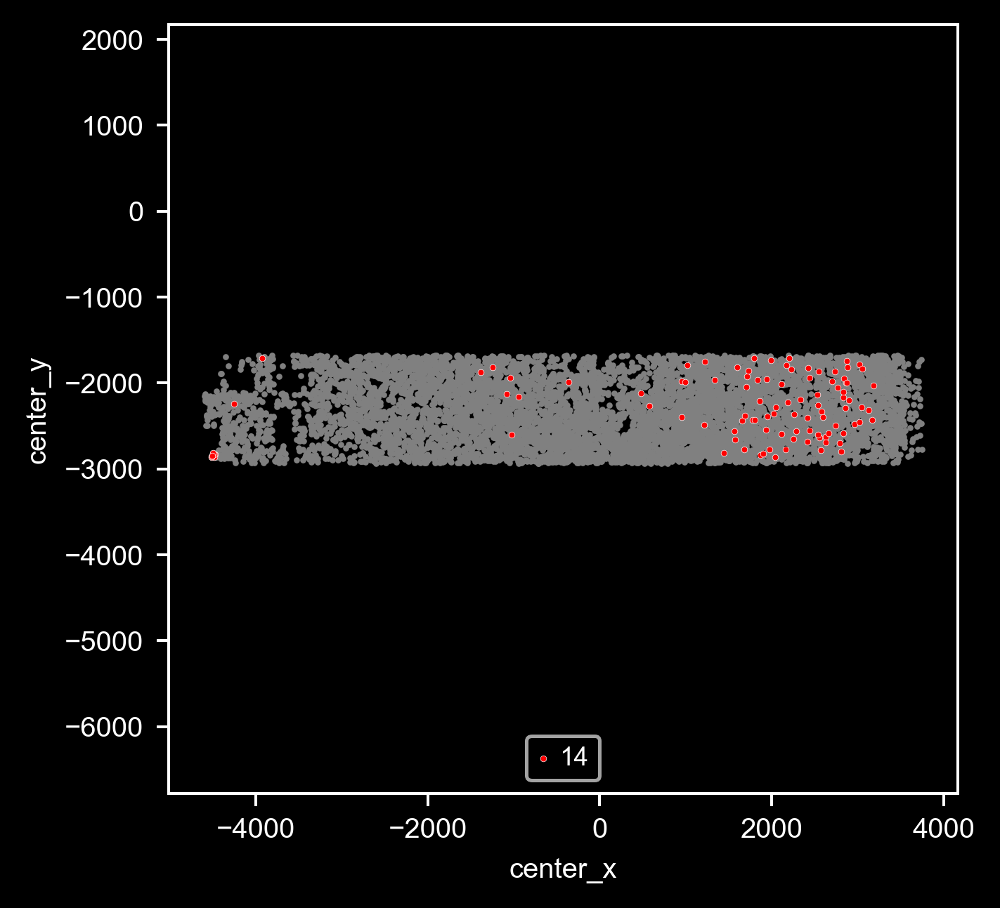

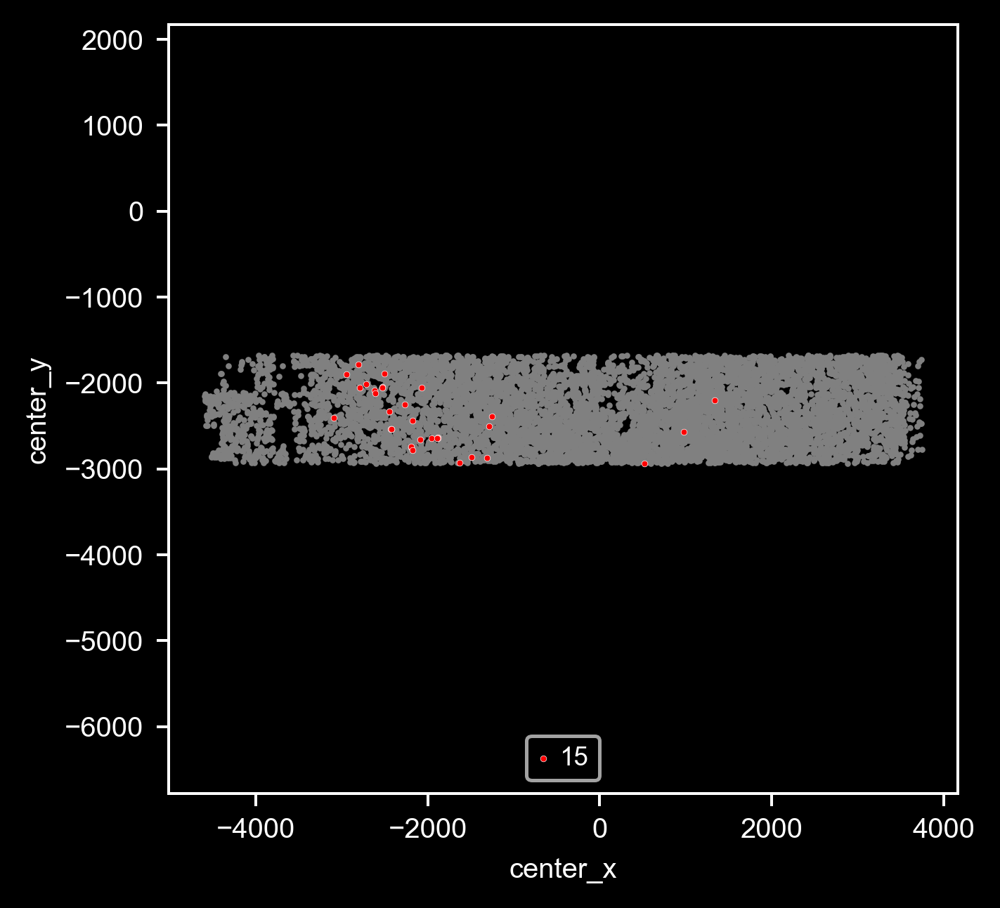

In [24]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
for _class in sorted(np.unique(adata.obs['leiden_cluster']), key=lambda v:int(v)):
    #plt.style.use('dark_background')
    ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                    color='grey', s=3, legend=True, linewidth=0)
    ax = sns.scatterplot(data=adata.obs.loc[adata.obs['leiden_cluster']==_class], 
                         x='center_x', y='center_y', 
                    color='r', s=3, legend=True, label=_class)
    ax.grid(False)
    plt.axis('equal')
    hs, ls = ax.get_legend_handles_labels()
    ax.legend(hs,ls, ncol=8, loc=8)
    plt.show()

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py

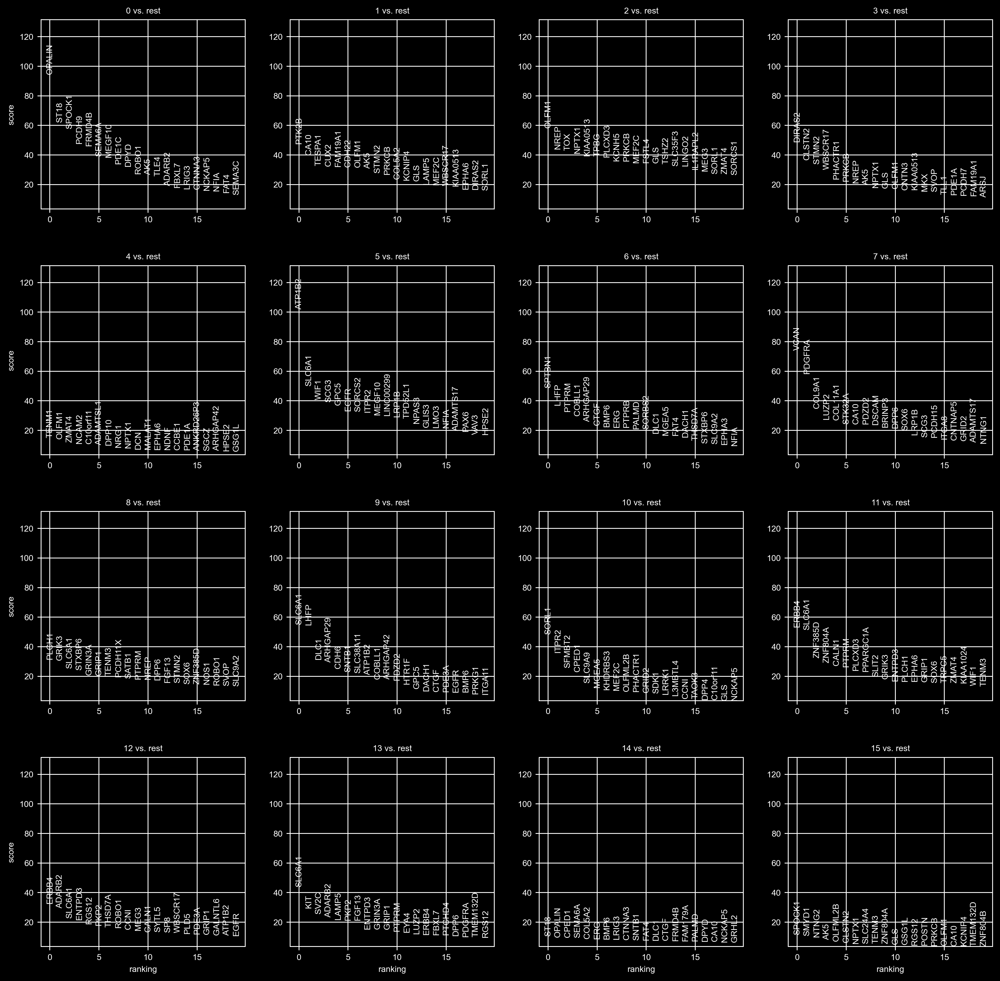

In [25]:
sc.tl.rank_genes_groups(adata, groupby='leiden_cluster', method='t-test')
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

## 6.2 Use lower expected pcs and resolution to UMAP for cell-type distinction at subclass level

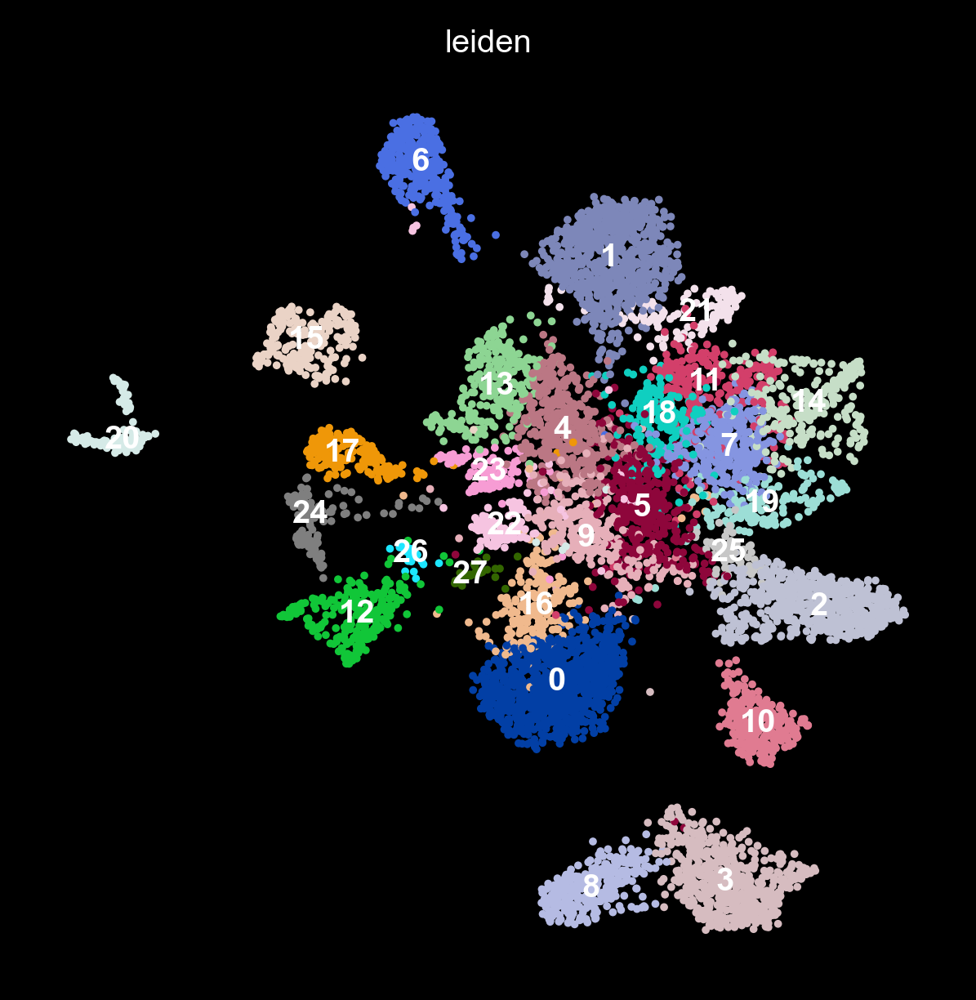

Wall time: 21 s


In [26]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

sc.tl.leiden(adata, resolution=2)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this new labels as a new column as 'leiden_subclass'
adata.obs['leiden_subclass'] = adata.obs.leiden

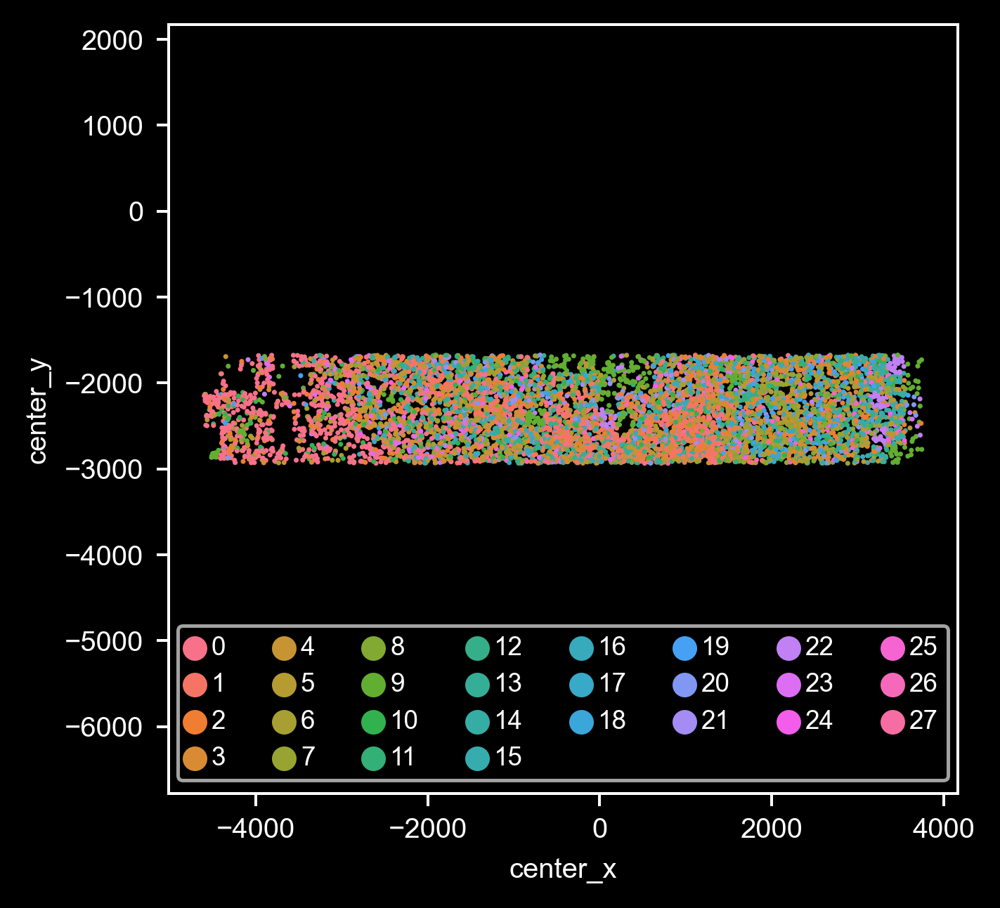

In [29]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                hue='leiden_subclass', s=2, legend=True, linewidth=0)
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])

# 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [30]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: \\mendel\Mendel_SSD3\MERFISH_Analysis\20220630-hMTG\PostAnalysis\filtered_cluster_data.h5ad


In [32]:
for _cls in np.unique(adata.obs['leiden_cluster']):
    mean_exp = df.iloc[np.where(adata.obs['leiden_cluster']==_cls)[0]].values.mean(0)
    print(_cls, df.columns[np.argsort(mean_exp)[:15]].values)

0 ['TSIX' 'HGF' 'ABCC3' 'ITGA11' 'FBN2' 'ADAMTS3' 'SLC9A2' 'GULP1' 'GRHL2'
 'ANKRD34B' 'MGAT4C' 'SYT10' 'PKP2' 'SLC22A25' 'ROR2']
1 ['TSIX' 'GRHL2' 'FBN2' 'GAS2L3' 'SLC22A25' 'SEMA3D' 'ANKRD34B' 'MCTP2'
 'SP8' 'BEND4' 'DCN' 'HGF' 'ABCC3' 'EYA4' 'GULP1']
10 ['GAS2L3' 'POSTN' 'HGF' 'GRHL2' 'FBN2' 'ANKRD26P3' 'ROR2' 'SMYD1' 'DCN'
 'ITGA11' 'SLC22A25' 'PALMD' 'ABCC3' 'TSIX' 'CHRNA6']
11 ['TSIX' 'FBN2' 'SP8' 'SEMA3D' 'EYA4' 'MALAT1' 'ABCC3' 'PKP2' 'GRHL2'
 'SLC22A25' 'ZNF804B' 'NDNF' 'ANKRD34B' 'SEMA3A' 'GPC6']
12 ['TSIX' 'GAS2L3' 'GRHL2' 'POSTN' 'SP8' 'SMYD1' 'ANKRD34B' 'FBN2' 'DCN'
 'NDNF' 'EYA4' 'MYO3A' 'CD163L1' 'HGF' 'MGAT4C']
13 ['SEMA3D' 'HGF' 'POSTN' 'CPED1' 'ANKRD34B' 'CCBE1' 'SP8' 'FBN2' 'DCN'
 'PALMD' 'GRHL2' 'GPC6' 'ARHGEF28' 'CHRNA6' 'DPP4']
14 ['SERPINE2' 'SEMA3D' 'PALMD' 'POSTN' 'BEND4' 'ANKRD34B' 'ABCC3' 'TSIX'
 'FBN2' 'GRHL2' 'GULP1' 'HGF' 'SLC22A25' 'ADAMTS3' 'PKP2']
15 ['SORBS2' 'PPARGC1A' 'TRHDE' 'COL5A2' 'GRIN3A' 'LINGO2' 'ARHGAP29' 'NDST3'
 'ANKRD30B' 'MKX' 'ZNF804A' '